In [1]:
import os
import pickle
import math
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import tensorflow
from sklearn.decomposition import PCA

2025-11-05 08:00:17.677695: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
label_file = 'us_continent_2024_dbscan_labels_eps18.5_min580.pkl'

In [3]:
label_file = os.path.join(os.getcwd(), label_file)
with open(label_file, 'rb') as f:
    dbscan_labels = pickle.load(f)
dbscan_labels

array([ 0, -1,  0, ...,  1, -1,  0], shape=(11600,))

In [4]:
vessel_type = 'tankers_and_cargo'
data_dir = f'/home/chucey/GQP/TrAISformer/data/US_data/cleaned_data/{vessel_type}/dbscan_data'
phases = ['train', 'test', 'valid']
# phases = ['train']
data_lengths = {'train': 10_000, 'test': 800, 'valid': 800}


for phase in phases:
    if phase=='train':
        labels_array = np.array(dbscan_labels[:data_lengths['train']])
    elif phase=='test':
        labels_array = np.array(dbscan_labels[10_000:10_800])
    else:
        labels_array = np.array(dbscan_labels[10_800:11_600])


    phase_file = f'us_continent_2024_dbscan_{phase}_track.pkl'
    phase_file_path = os.path.join(data_dir, phase_file)
    print(f'Processing {phase} data from {phase_file_path}...')
    
    with open(phase_file_path, 'rb') as f:
        data = pickle.load(f)
    for idx in range(len(data)):
        data[idx]['dbscan_label'] = labels_array[idx]
    # Save the updated data with labels
    output_file = f'us_continent_2024_dbscan_{phase}_track_labeled.pkl'
    output_file_path = os.path.join(data_dir, 'labels', output_file)
    with open(output_file_path, 'wb') as f:
        pickle.dump(data, f)
    
    print(f'Labeled {len(data)} entries for phase {phase}.')
    print(f'Saved labeled data to {output_file_path}')


Processing train data from /home/chucey/GQP/TrAISformer/data/US_data/cleaned_data/tankers_and_cargo/dbscan_data/us_continent_2024_dbscan_train_track.pkl...
Labeled 10000 entries for phase train.
Saved labeled data to /home/chucey/GQP/TrAISformer/data/US_data/cleaned_data/tankers_and_cargo/dbscan_data/labels/us_continent_2024_dbscan_train_track_labeled.pkl
Processing test data from /home/chucey/GQP/TrAISformer/data/US_data/cleaned_data/tankers_and_cargo/dbscan_data/us_continent_2024_dbscan_test_track.pkl...
Labeled 800 entries for phase test.
Saved labeled data to /home/chucey/GQP/TrAISformer/data/US_data/cleaned_data/tankers_and_cargo/dbscan_data/labels/us_continent_2024_dbscan_test_track_labeled.pkl
Processing valid data from /home/chucey/GQP/TrAISformer/data/US_data/cleaned_data/tankers_and_cargo/dbscan_data/us_continent_2024_dbscan_valid_track.pkl...
Labeled 800 entries for phase valid.
Saved labeled data to /home/chucey/GQP/TrAISformer/data/US_data/cleaned_data/tankers_and_cargo/db

In [5]:
def load_pickled_data(phase: str) -> list[dict]:
    """Load pickled data from the specified file path."""
    file_path = f'/home/chucey/GQP/TrAISformer/data/US_data/cleaned_data/{vessel_type}/dbscan_data/labels/us_continent_2024_dbscan_{phase}_track_labeled.pkl'
    with open(file_path, 'rb') as f:
        data = pickle.load(f)
    return data

In [6]:
def validate_labels(phase: str, labels: np.ndarray) -> bool:
    data_lengths = {'train': 10_000, 'test': 800, 'valid': 800}
    data: list[dict] = load_pickled_data(phase)
    if len(data) != data_lengths[phase]:
        return False
    if phase=='train':
        expected_labels = labels[:data_lengths[phase]]
    elif phase=='test':
        expected_labels = labels[10_000:10_800]
    else:  # phase=='valid'
        expected_labels = labels[10_800:11_600]
    for idx in range(len(data)):
        if 'dbscan_label' not in data[idx]:
            return False
        if data[idx]['dbscan_label'] != expected_labels[idx]:
            return False    
    return True


In [7]:
validate_labels('train', dbscan_labels),validate_labels('test', dbscan_labels),validate_labels('valid', dbscan_labels)

(True, True, True)

In [8]:
# data = load_pickled_data('train')
# vessel_types = set()
# for idx in range(len(data)):
#     vessel_types.add(data[idx]['traj'][0, 7].item())
# # vessel_types
# # vessel_types.add(data[0]['traj'][0, 7].item())
# # vessel_types

In [9]:
train_data = load_pickled_data('train')
test_data = load_pickled_data('test')
valid_data = load_pickled_data('valid')

LAT, LON, SOG, COG, HEADING, TIMESTAMP, MMSI, SHIPTYPE, LENGTH, WIDTH, CARGO  = list(range(11))

df_cols = ['mmsi', 'timestamp', 'lat', 'lon', 'sog', 'cog', 'vessel_type', 'dbscan_label']

def create_dataframe(data: list[dict]) -> pd.DataFrame:
    lat = []
    lon = []
    sog = []
    cog = []
    timestamp = []
    mmsi = []
    vessel_type = []
    dbscan_label = []
    for entry in data:
        traj = entry['traj']
        lat.append(pd.Series(traj[:, LAT]))
        lon.append(pd.Series(traj[:, LON]))
        sog.append(pd.Series(traj[:, SOG]))
        cog.append(pd.Series(traj[:, COG]))
        timestamp.append(pd.Series(traj[:, TIMESTAMP]))
        mmsi.append(pd.Series(traj[:, MMSI]))
        vessel_type.append(traj[0,SHIPTYPE])
        dbscan_label.append(entry['dbscan_label'].item())
    df = pd.DataFrame({
        'mmsi': mmsi,
        'timestamp': timestamp,
        'lat': lat,
        'lon': lon,
        'sog': sog,
        'cog': cog,
        'vessel_type': vessel_type,
        'dbscan_label': dbscan_label
    })
    return df

train_df = create_dataframe(train_data)
test_df = create_dataframe(test_data)
valid_df = create_dataframe(valid_data)


In [10]:
train_df.head()

,mmsi,timestamp,lat,lon,sog,cog,vessel_type,dbscan_label
0,0 354184000.0 1 354184000.0 2 3541...,0 1.704815e+09 1 1.704816e+09 2 1....,0 0.096987 1 0.096759 2 0.096530 3...,0 0.754167 1 0.754719 2 0.755270 3...,0 0.620000 1 0.618727 2 0.617454 3...,0 0.279722 1 0.278449 2 0.277176 3...,80.0,0
1,0 229079000.0 1 229079000.0 2 2290...,0 1.706855e+09 1 1.706855e+09 2 1....,0 0.205181 1 0.204422 2 0.203659 3...,0 0.655752 1 0.655768 2 0.655770 3...,0 0.366667 1 0.366190 2 0.366667 3...,0 0.487381 1 0.495238 2 0.497990 3...,89.0,-1
2,0 319031900.0 1 319031900.0 2 3190...,0 1.707348e+09 1 1.707349e+09 2 1....,0 0.144255 1 0.144297 2 0.144240 3...,0 0.798107 1 0.798099 2 0.798113 3...,0 0.003333 1 0.026691 2 0.027963 3...,0 0.933611 1 0.861756 2 0.355201 3...,37.0,0
3,0 256062000.0 1 256062000.0 2 2...,0 1.706179e+09 1 1.706180e+09 2 ...,0 0.373078 1 0.372368 2 0.37163...,0 0.299534 1 0.300068 2 0.30060...,0 0.630000 1 0.628810 2 0.63628...,0 0.341944 1 0.338929 2 0.34452...,71.0,1
4,0 256062000.0 1 256062000.0 2 2560...,0 1.706334e+09 1 1.706335e+09 2 1....,0 0.175096 1 0.174363 2 0.173552 3...,0 0.424206 1 0.424613 2 0.425066 3...,0 0.616667 1 0.620861 2 0.622023 3...,0 0.358056 1 0.358898 2 0.359285 3...,71.0,0


In [11]:
# combine all dataframes
combined_df = pd.concat([train_df, test_df, valid_df], ignore_index=True)
combined_df.head()

,mmsi,timestamp,lat,lon,sog,cog,vessel_type,dbscan_label
0,0 354184000.0 1 354184000.0 2 3541...,0 1.704815e+09 1 1.704816e+09 2 1....,0 0.096987 1 0.096759 2 0.096530 3...,0 0.754167 1 0.754719 2 0.755270 3...,0 0.620000 1 0.618727 2 0.617454 3...,0 0.279722 1 0.278449 2 0.277176 3...,80.0,0
1,0 229079000.0 1 229079000.0 2 2290...,0 1.706855e+09 1 1.706855e+09 2 1....,0 0.205181 1 0.204422 2 0.203659 3...,0 0.655752 1 0.655768 2 0.655770 3...,0 0.366667 1 0.366190 2 0.366667 3...,0 0.487381 1 0.495238 2 0.497990 3...,89.0,-1
2,0 319031900.0 1 319031900.0 2 3190...,0 1.707348e+09 1 1.707349e+09 2 1....,0 0.144255 1 0.144297 2 0.144240 3...,0 0.798107 1 0.798099 2 0.798113 3...,0 0.003333 1 0.026691 2 0.027963 3...,0 0.933611 1 0.861756 2 0.355201 3...,37.0,0
3,0 256062000.0 1 256062000.0 2 2...,0 1.706179e+09 1 1.706180e+09 2 ...,0 0.373078 1 0.372368 2 0.37163...,0 0.299534 1 0.300068 2 0.30060...,0 0.630000 1 0.628810 2 0.63628...,0 0.341944 1 0.338929 2 0.34452...,71.0,1
4,0 256062000.0 1 256062000.0 2 2560...,0 1.706334e+09 1 1.706335e+09 2 1....,0 0.175096 1 0.174363 2 0.173552 3...,0 0.424206 1 0.424613 2 0.425066 3...,0 0.616667 1 0.620861 2 0.622023 3...,0 0.358056 1 0.358898 2 0.359285 3...,71.0,0


In [12]:
# determine label counts
combined_df.dbscan_label.value_counts()


dbscan_label
 1    5899
-1    3382
 0    2319
Name: count, dtype: int64

In [13]:
# downsample data
# class_0 = combined_df[combined_df.dbscan_label == 0]
# class_1 = combined_df[combined_df.dbscan_label == 1]
# class_noise = combined_df[combined_df.dbscan_label == -1]
# len(class_0), len(class_1), len(class_noise)
# class_0_sampled = class_0.sample(n = 3200, random_state=42)

# combined_df = pd.concat([class_0_sampled, class_1, class_noise])
# combined_df.dbscan_label.value_counts()


In [14]:
classes = set(combined_df['dbscan_label'])


In [15]:
from sklearn.model_selection import StratifiedShuffleSplit
features = ['lat', 'lon', 'sog', 'cog']
X = combined_df[features]
y = combined_df['dbscan_label']

sss = StratifiedShuffleSplit(n_splits=1, test_size=0.1, random_state=42)
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((10440, 4), (1160, 4), (10440,), (1160,))

In [16]:
y_train.value_counts(), y_test.value_counts()


(dbscan_label
  1    5309
 -1    3044
  0    2087
 Name: count, dtype: int64,
 dbscan_label
  1    590
 -1    338
  0    232
 Name: count, dtype: int64)

In [17]:
def pad_zeros(series: pd.Series, target_length: int) -> np.ndarray:
    """Pad a pandas Series with zeros to reach the target length."""
    current_length = len(series)
    if current_length >= target_length:
        return series.values[:target_length]
    else:
        padding = np.zeros(target_length - current_length)
        return np.concatenate([series, padding])

In [18]:
# make arrays equal length by padding with zeros
target_length = max(X_train['lat'].apply(len).max(), X_test['lat'].apply(len).max())
print(f'Target length for padding: {target_length}')
for col in features:
    X_train[col] = X_train[col].apply(lambda x: pad_zeros(x, target_length))
    X_test[col] = X_test[col].apply(lambda x: pad_zeros(x, target_length))

X_train.head()

Target length for padding: 144


/tmp/ipykernel_2024919/2801078336.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[col] = X_train[col].apply(lambda x: pad_zeros(x, target_length))
/tmp/ipykernel_2024919/2801078336.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[col] = X_test[col].apply(lambda x: pad_zeros(x, target_length))


,lat,lon,sog,cog
8257,"[0.22795028873240372, 0.22795005625000372, 0.2...","[0.6979328154929483, 0.6979329775000039, 0.697...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.4316666666666667, 0.924954861111111, 0.9720..."
3928,"[0.25469585277778695, 0.2546962718579243, 0.25...","[0.6898499177777826, 0.6898500087431685, 0.689...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.9094444444444444, 0.9094444444444444, 0.909..."
1735,"[0.535721, 0.5357202540322632, 0.5357405464401...","[0.7181753999999999, 0.7181692573732456, 0.718...","[0.05, 0.0056835637480798775, 0.01265126512651...","[0.5933333333333333, 0.9941116231438812, 0.885..."
5637,"[0.020131960215107103, 0.020407711887760537, 0...","[0.02655937540376101, 0.026377048653758096, 0....","[0.2413526570048309, 0.2522685185185185, 0.240...","[0.8470974235104669, 0.8404552469135802, 0.842..."
1998,"[0.5532322716081252, 0.5527804250020644, 0.552...","[0.8953404234549471, 0.8953411900020893, 0.895...","[0.22411522633744857, 0.21466666666666664, 0.2...","[0.49269890260631005, 0.49675, 0.5090016103059..."


In [19]:
# convert to numpy 3D arrays for classification
def df_to_numpy(df: pd.DataFrame, n_timesteps: int = target_length) -> np.ndarray:
    '''convert a Dataframe to a 3d numpy array for classification
    of shape (n_samples, timesteps, num_features)'''
    n_samples = len(df)
    n_features = len(df.columns)
    arr = np.zeros((n_samples, n_timesteps, n_features))

    #fill in the array
    for i in range(n_samples):
        for j, col in enumerate(df.columns):
            arr[i, :, j] = df.iloc[i][col]
    return arr



In [20]:
# prep data for training
X_train_arr = df_to_numpy(X_train)
X_test_arr = df_to_numpy(X_test)
print(f"===Training data=== Features: {X_train_arr.shape} Labels: {y_train.shape}" )
print(f"===Testing data=== Features: {X_test_arr.shape} Labels: {y_test.shape}" )

===Training data=== Features: (10440, 144, 4) Labels: (10440,)
===Testing data=== Features: (1160, 144, 4) Labels: (1160,)


In [41]:
from sktime.classification.deep_learning import GRUFCNNClassifier
from sktime.classification.deep_learning import LSTMFCNClassifier
from sktime.classification.deep_learning import GRUClassifier
from sklearn.metrics import classification_report

gru_fcnn = GRUFCNNClassifier(
    hidden_dim=144, 
    gru_layers=2, 
    conv_layers=[128, 256, 128],  # Correct parameter name
    gru_dropout=0.2,
    dropout=0.2,
    num_epochs=22,  # Correct parameter name
    batch_size=64, 
    random_state=42,
    verbose=True  # To see training progress
)

# gru = GRUClassifier(
#     hidden_dim=144,
#     n_layers=4,
#     dropout=0.2,
#     num_epochs=10,
#     batch_size=32,
#     verbose=True,
#     random_state = True
# )

# lstm = LSTMFCNClassifier(
#     n_epochs=10,
#     batch_size=32,
#     dropout=0.2,
#     lstm_size=120,
#     attention=True,
#     verbose=1
# )

gru_fcnn.fit(X_train_arr, y_train)
# Make predictions
print("Making predictions...")
y_pred = gru_fcnn.predict(X_test_arr)
X_test['predicted_label'] = y_pred
# Evaluate results
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Show some additional metrics
from sklearn.metrics import confusion_matrix, accuracy_score
print(f"\nAccuracy: {accuracy_score(y_test, y_pred):.3f}")
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Epoch 1: Loss: 0.2973976816709449
Epoch 2: Loss: 0.25320357913378533
Epoch 3: Loss: 0.24347283627565314
Epoch 4: Loss: 0.23059409452465976
Epoch 5: Loss: 0.21759455891825805
Epoch 6: Loss: 0.2047602393459983
Epoch 7: Loss: 0.19589474893788375
Epoch 8: Loss: 0.18471374446185443
Epoch 9: Loss: 0.17722962697309147
Epoch 10: Loss: 0.16074065166729978
Epoch 11: Loss: 0.1627521594225361
Epoch 12: Loss: 0.15271020221535297
Epoch 13: Loss: 0.14796826264979998
Epoch 14: Loss: 0.1397080245405072
Epoch 15: Loss: 0.12668496828736375
Epoch 16: Loss: 0.12132620888765015
Epoch 17: Loss: 0.11309619302855714
Epoch 18: Loss: 0.10266406728996805
Epoch 19: Loss: 0.11048752720263309
Epoch 20: Loss: 0.10328143856247884
Epoch 21: Loss: 0.10001062746773752
Epoch 22: Loss: 0.09919519301875858
Making predictions...

Classification Report:
              precision    recall  f1-score   support

          -1       0.86      0.92      0.89       338
           0       1.00      0.94      0.97       232
           1

/tmp/ipykernel_2024919/3181623216.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test['predicted_label'] = y_pred


In [44]:
# Save the trained model
model_path = '/home/chucey/GQP/TrAISformer/data/US_data/cleaned_data/tankers_and_cargo/dbscan_data/labels/model'
if not os.path.exists(model_path):
    os.makedirs(model_path)
model_file = f'gru_fcnn_dbscan_model.pkl'
with open(os.path.join(model_path, model_file), 'wb') as f:
    pickle.dump(gru_fcnn, f)

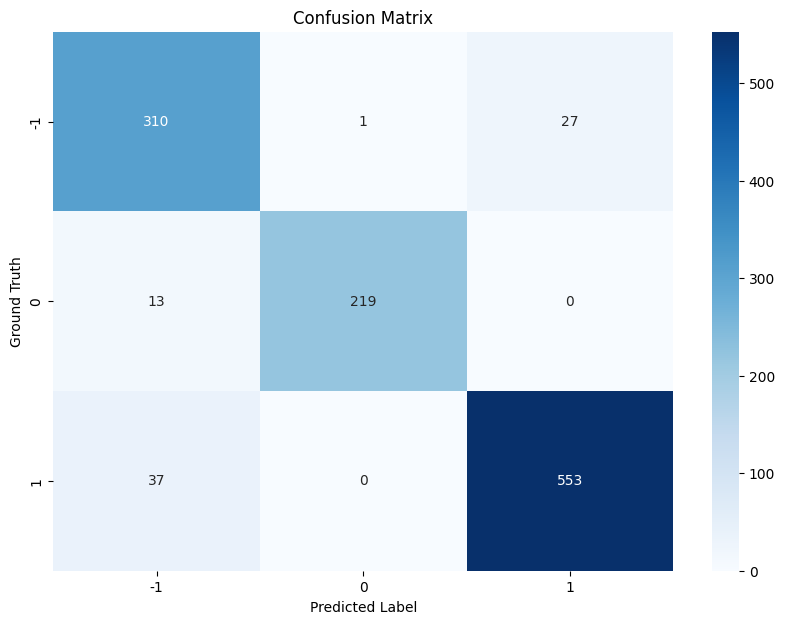

Classes in order: [-1, 0, 1]
Confusion matrix shape: (3, 3)


In [45]:
import seaborn as sns
import matplotlib.pyplot as plt
# create nice confusion matrix with properly ordered labels
classes_ordered = sorted(classes)  # Sort the classes to ensure proper order: [-1, 0, 1]
cm = confusion_matrix(y_test, y_pred, labels=classes_ordered)  # Specify label order
plt.figure(figsize = (10,7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=True,
            xticklabels=classes_ordered,
            yticklabels=classes_ordered)
plt.xlabel('Predicted Label')
plt.ylabel('Ground Truth')
plt.title('Confusion Matrix')
plt.show()

# Print the order for verification
print(f"Classes in order: {classes_ordered}")
print(f"Confusion matrix shape: {cm.shape}")

In [46]:
X_test_comapared = X_test.copy()
X_test_comapared['true_label'] = y_test.values
# Save the comparison dataframe
comparison_path = '/home/chucey/GQP/TrAISformer/data/US_data/cleaned_data/tankers_and_cargo/dbscan_data/labels/'
if not os.path.exists(comparison_path):
    os.makedirs(comparison_path)
X_test_comapared.to_csv(os.path.join(comparison_path, 'gru_fcnn_dbscan_test_comparison.csv'), index=False)


In [47]:
X_test_correct_preds = X_test_comapared[X_test_comapared['predicted_label'] == X_test_comapared['true_label']]
X_test_correct_preds.reset_index(inplace=True)
X_test_correct_preds.head()

,index,lat,lon,sog,cog,predicted_label,true_label
0,7531,"[0.11257550000000008, 0.11238168674444396, 0.1...","[0.787787, 0.7874997478550333, 0.7872070374188...","[0.3233333333333333, 0.33051643192488267, 0.33...","[0.7052777777777778, 0.7020970266040689, 0.702...",-1,-1
1,7632,"[0.228319239918327, 0.2283191633486558, 0.2283...","[0.6979949919346597, 0.6979949306789135, 0.697...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.03642447960977823, 0.18437411377687027, 0.3...",-1,-1
2,645,"[0.51794725, 0.5179473978873442, 0.51794725000...","[0.8675982000000001, 0.8675984112676244, 0.867...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",-1,-1
3,7421,"[0.23983412180748695, 0.2396319178613589, 0.23...","[0.6903142000214317, 0.6903575342927624, 0.690...","[0.14410256410256408, 0.1000952380952381, 0.19...","[0.42464031339031344, 0.4193968253968254, 0.32...",1,1
4,5540,"[0.24611574632352973, 0.24611512857143064, 0.2...","[0.6603333, 0.660333474285718, 0.6603332941176...","[0.0, 0.0, 0.0, 0.039701492537313435, 0.007971...","[0.0925, 0.0925, 0.0925, 0.6977031509121061, 0...",1,1


In [48]:
def predict_single_sample(model, sample: pd.DataFrame) -> int:
    """Predict the label for a single sample using the trained model."""
    sample_arr = df_to_numpy(sample)
    predicted_label = model.predict(sample_arr)
    return predicted_label[0]

In [49]:
loaded_model_path = os.path.join(model_path, model_file)
with open(loaded_model_path, 'rb') as f:
    loaded_model = pickle.load(f)

test_index = 500
sample = X_test_correct_preds.loc[[test_index], ['lat', 'lon','sog','cog']] # Select single sample as DataFrame

predicted_label = predict_single_sample(loaded_model, sample)
predicted_label

np.int64(-1)

In [50]:
classes


{-1, 0, 1}

In [51]:
test_traj = test_data[0]['traj']
# test_traj
# run model on single trajectory
def run_model_on_single_trajectory(traj):
    single_traj = traj[:, [LAT, LON, SOG, COG]]
    mmsi = traj[0, MMSI]
    duration = (traj.shape[0] * 10) / 60
    # pad single_traj to target length
    if single_traj.shape[0] < target_length:
        padding = np.zeros((target_length - single_traj.shape[0], single_traj.shape[1]))
        single_traj_padded = np.vstack([single_traj, padding])
    else:
        single_traj_padded = single_traj[:target_length, :]
    test_pred = gru_fcnn.predict(single_traj_padded[np.newaxis, :, :])
    return int(mmsi), duration, test_pred.item()

def denormalize_coordinates(coordinates:np.ndarray) -> np.ndarray:
    lat = coordinates[:, 0] * (lat_max - lat_min) + lat_min
    lon = coordinates[:, 1] * (lon_max - lon_min) + lon_min
    sog = coordinates[:, 2] * max_sog  # speed over ground
    cog = coordinates[:, 3] * max_cog  # course over ground
    return np.column_stack((lat, lon, sog, cog))

def plot_trajectory_with_label(traj: np.ndarray):
    denorm = denormalize_coordinates(traj[:, [LAT, LON, SOG, COG]])
    mmsi, duration, test_pred = run_model_on_single_trajectory(traj)
    color = 'red' if test_pred == -1 else 'green'
    latitudes = denorm[:, LAT]
    longitudes = denorm[:, LON]
    speeds = denorm[:, SOG]

    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(longitudes, latitudes, c = speeds, cmap='plasma')
    plt.plot(longitudes, latitudes, alpha =0.6, color = 'gray', linewidth = 1.0)
    cbar = plt.colorbar(scatter, shrink=0.8)
    cbar.set_label('Speed (knots)', fontsize=12, fontweight='bold')

    plt.title(f'Trajectory of MMSI: {mmsi}\nDuration: {duration:.1f} hours\nTrack Label: {test_pred}\nDescription: {'Anamoly' if test_pred == -1 else 'Normal Behavior'}', color = color)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.grid()
    plt.show()



In [52]:
# convert normalized back to lat/lon
lat_min, lat_max = 20, 60
lon_min, lon_max = -160, -60
max_sog = 30
max_cog = 360

In [53]:
X_test_arr[0]

array([[0.1125755 , 0.787787  , 0.32333333, 0.70527778],
       [0.11238169, 0.78749975, 0.33051643, 0.70209703],
       [0.1121745 , 0.78720704, 0.34      , 0.70253472],
       [0.1119595 , 0.786912  , 0.34      , 0.69888889],
       [0.11175121, 0.78661707, 0.33908213, 0.70308374],
       [0.11154936, 0.78632259, 0.33333333, 0.70440476],
       [0.11135596, 0.78602984, 0.33285714, 0.70563492],
       [0.11116741, 0.78573709, 0.33612022, 0.70602004],
       [0.11098534, 0.78544294, 0.33666667, 0.70777778],
       [0.110803  , 0.7851459 , 0.34      , 0.69861111],
       [0.11058806, 0.78484997, 0.34442623, 0.70582423],
       [0.11038414, 0.78454819, 0.35      , 0.70361111],
       [0.1101775 , 0.7842417 , 0.35333333, 0.70555556],
       [0.10996575, 0.783935  , 0.35666667, 0.70194444],
       [0.10974926, 0.78362768, 0.35140097, 0.70242754],
       [0.109529  , 0.7833245 , 0.34904762, 0.70130952],
       [0.10930016, 0.78302433, 0.35046948, 0.69762128],
       [0.1091053 , 0.7827261 ,

In [92]:
predicted_samples_list = []

In [93]:
# test_traj = test_data[28]['traj']
test_indices = [52, 53, 9, 16, 50, 27]

nols = 2
nrows = math.ceil(len(test_indices) / nols)

fig, axes = plt.subplots(nrows, nols, figsize=(30, 30), dpi=500)
fig.suptitle(f'Vessel Trajectories with predicted Cluster Label - Speed Colored', fontsize=18, fontweight='bold', y=0.98)

# Flatten axes array for easy iteration
axes_flat = axes.flatten()

for idx, traj_idx in enumerate(test_indices):
    test_traj = test_data[traj_idx]['traj']
    
    # Get the current subplot
    ax = axes_flat[idx]
    
    # Denormalize and get prediction
    denorm = denormalize_coordinates(test_traj[:, [LAT, LON, SOG, COG]])
    mmsi, duration, test_pred = run_model_on_single_trajectory(test_traj)

    sample_dict = {}
    sample_dict['sample'] = idx + 1
    sample_dict['mmsi'] = mmsi
    sample_dict['duration_hours'] = duration
    sample_dict['predicted_label'] = test_pred
    sample_dict['traj'] = denorm
    predicted_samples_list.append(sample_dict)
    
    # Determine color based on prediction
    color = 'red' if test_pred == -1 else 'green'
    
    # Extract coordinates and speeds
    latitudes = denorm[:, LAT]
    longitudes = denorm[:, LON]
    speeds = denorm[:, SOG]
    
    # Plot on the current subplot
    scatter = ax.scatter(longitudes, latitudes, c=speeds, cmap='plasma', s=50, alpha=0.8)
    ax.plot(longitudes, latitudes, alpha=0.6, color='gray', linewidth=1.0)
    
    # Add colorbar
    cbar = plt.colorbar(scatter, ax=ax, shrink=0.8)
    cbar.set_label('Speed (knots)', fontsize=10, fontweight='bold')
    
    # Set title and labels
    ax.set_title(f'MMSI: {mmsi}\nDuration: {duration:.1f} hrs\nLabel: {test_pred}\n{"Anomaly" if test_pred == -1 else "Normal"}', 
                 color=color, fontsize=12, fontweight='bold')
    ax.set_xlabel('Longitude', fontsize=10)
    ax.set_ylabel('Latitude', fontsize=10)
    ax.grid(True, alpha=0.3)

# Hide any unused subplots
for idx in range(len(test_indices), len(axes_flat)):
    axes_flat[idx].set_visible(False)

plt.subplots_adjust(hspace=0.2, wspace=0.1, top=0.93)
plt.show()

In [55]:
def cluster(X, eps, min_samples, distance_metric):
    '''Performs DBSCAN clustering on the provided data X with specified parameters.'''
    dbscan = TimeSeriesDBSCAN(eps=eps, min_samples=min_samples, distance=distance_metric, n_jobs=-1)
    dbscan.fit(X)
    labels = dbscan.labels_
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = list(labels).count(-1)
    n_samples = X.shape[0]
    
    # Silhouette score requires at least 2 clusters
    sil_score = silhouette_score(X.reshape(n_samples, -1), labels) if n_clusters > 1 else None
    
    return {
        'eps': eps,
        'min_samples': min_samples,
        'distance': distance_metric,
        'n_clusters': n_clusters,
        'labels': labels,
        'n_noise': n_noise,
        'silhouette_score': sil_score,
    }

def evaluate_clustering(X, labels, metric_name=""):
    """
    Comprehensive evaluation of clustering results for time series data
    """
    print(f"\n{metric_name} Clustering Evaluation:")
    print("-" * 40)
    
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = list(labels).count(-1)
    n_samples = len(labels)
    
    print(f"Number of clusters: {n_clusters}")
    print(f"Number of noise points: {n_noise} ({n_noise/n_samples*100:.1f}%)")
    print(f"Number of clustered points: {n_samples - n_noise} ({(n_samples-n_noise)/n_samples*100:.1f}%)")
    
    if n_clusters > 1 and n_noise < n_samples:
        # Only calculate metrics if we have meaningful clusters
        X_flat = X.reshape(X.shape[0], -1)
        
        # Remove noise points for internal metrics
        non_noise_mask = labels != -1
        if np.sum(non_noise_mask) > 0:
            X_clean = X_flat[non_noise_mask]
            labels_clean = labels[non_noise_mask]
            
            if len(set(labels_clean)) > 1:
                # Calinski-Harabasz Index (higher is better)
                ch_score = calinski_harabasz_score(X_clean, labels_clean)
                print(f"Calinski-Harabasz Index: {ch_score:.3f} (higher = better)")
                
                # Davies-Bouldin Index (lower is better)
                db_score = davies_bouldin_score(X_clean, labels_clean)
                print(f"Davies-Bouldin Index: {db_score:.3f} (lower = better)")
                
                # Silhouette Score (for comparison)
                sil_score = silhouette_score(X_clean, labels_clean)
                print(f"Silhouette Score: {sil_score:.3f} (higher = better)")
        
        # Cluster size distribution
        unique_labels, counts = np.unique(labels[labels != -1], return_counts=True)
        print(f"Cluster sizes: {dict(zip(unique_labels, counts))}")
        
        # Assess cluster balance
        if len(counts) > 0:
            size_ratio = max(counts) / min(counts) if min(counts) > 0 else float('inf')
            print(f"Cluster size ratio (max/min): {size_ratio:.2f} (closer to 1 = more balanced)")
    
    else:
        print("Cannot calculate internal metrics: insufficient clusters or all points are noise")
    
    return {
        'n_clusters': n_clusters,
        'n_noise': n_noise,
        'noise_ratio': n_noise/n_samples,
        'n_samples': n_samples,
        'Calinski-Harabasz': ch_score if n_clusters > 1 and n_noise < n_samples else None,
        'Davies-Bouldin': db_score if n_clusters > 1 and n_noise < n_samples else None,
        'size_ratio': size_ratio
    }

def find_best_text_position(longitudes, latitudes, figure_width=10, figure_height=6):
    """
    Find the best position for text box on plots to avoid data overlap and visual elements
    Returns (x, y, ha, va) coordinates and alignment
    """
    # Normalize coordinates to [0,1] range for plot positioning
    lon_range = longitudes.max() - longitudes.min()
    lat_range = latitudes.max() - latitudes.min()
    
    if lon_range == 0 or lat_range == 0:
        return 0.02, 0.98, 'left', 'top'  # Default to top-left if no range
    
    lon_norm = (longitudes - longitudes.min()) / lon_range
    lat_norm = (latitudes - latitudes.min()) / lat_range
    
    # Define candidate positions - AVOID COLORBAR AREA (right edge)
    # Prioritize corners and edges that are less likely to have data
    # Adjusted positions for LARGER text boxes with speed + COG information
    candidates = [
        (0.02, 0.98, 'left', 'top'),     # top-left (preferred)
        (0.02, 0.02, 'left', 'bottom'),  # bottom-left
        (0.25, 0.98, 'left', 'top'),     # top-left-center (moved closer to left)
        (0.25, 0.02, 'left', 'bottom'),  # bottom-left-center (moved closer to left)
        (0.45, 0.98, 'center', 'top'),   # top-center (moved left to avoid colorbar)
        (0.45, 0.02, 'center', 'bottom'), # bottom-center (moved left)
        (0.65, 0.98, 'right', 'top'),    # top-right-center (moved further left)
        (0.65, 0.02, 'right', 'bottom'), # bottom-right-center (moved further left)
        (0.02, 0.50, 'left', 'center'),  # middle-left
        (0.65, 0.50, 'right', 'center'), # middle-right (moved further left)
        (0.02, 0.75, 'left', 'top'),     # upper-left-middle (new position)
        (0.02, 0.25, 'left', 'bottom')   # lower-left-middle (new position)
    ]
    
    best_position = candidates[0]  # default to top-left
    min_score = float('inf')
    
    # Check each candidate position
    for x, y, ha, va in candidates:
        # Define text box region with accurate sizing for LARGER boxes (speed + COG stats)
        # Text now includes: Speed range, Avg speed, Mean COG, COG Std - requiring more space
        if ha == 'right':
            box_x_min, box_x_max = x - 0.18, x  # Increased from 0.12 to 0.18 for wider text
        elif ha == 'left':
            box_x_min, box_x_max = x, x + 0.18  # Increased width
        else:  # center
            box_x_min, box_x_max = x - 0.09, x + 0.09  # Increased from 0.06 to 0.09
            
        if va == 'top':
            box_y_min, box_y_max = y - 0.10, y  # Increased from 0.06 to 0.10 for taller text
        elif va == 'bottom':
            box_y_min, box_y_max = y, y + 0.10  # Increased height for 4-5 lines of text
        else:  # center
            box_y_min, box_y_max = y - 0.05, y + 0.05  # Increased from 0.03 to 0.05
        
        # Count data points that would overlap with text box
        overlap_count = np.sum(
            (lon_norm >= box_x_min) & (lon_norm <= box_x_max) &
            (lat_norm >= box_y_min) & (lat_norm <= box_y_max)
        )
        
        # Calculate data density in nearby regions (penalize crowded areas)
        # Increased margin to account for larger text boxes
        extended_margin = 0.08  # Increased from 0.05 to 0.08 for larger clearance
        extended_x_min = max(0, box_x_min - extended_margin)
        extended_x_max = min(1, box_x_max + extended_margin)
        extended_y_min = max(0, box_y_min - extended_margin)
        extended_y_max = min(1, box_y_max + extended_margin)
        
        nearby_count = np.sum(
            (lon_norm >= extended_x_min) & (lon_norm <= extended_x_max) &
            (lat_norm >= extended_y_min) & (lat_norm <= extended_y_max)
        )
        
        # Calculate trajectory path density (avoid dense trajectory areas)
        trajectory_density = 0
        if len(longitudes) > 1:
            # Check how many trajectory segments pass near this position
            for i in range(len(longitudes) - 1):
                seg_lon = [lon_norm[i], lon_norm[i+1]]
                seg_lat = [lat_norm[i], lat_norm[i+1]]
                
                # Simple check if segment intersects text box region
                if (min(seg_lon) <= box_x_max and max(seg_lon) >= box_x_min and
                    min(seg_lat) <= box_y_max and max(seg_lat) >= box_y_min):
                    trajectory_density += 1
        
        # Penalty for being too close to right edge (colorbar area)
        colorbar_penalty = max(0, (x - 0.75) * 10) if x > 0.75 else 0
        
        # Combined score: prioritize positions with less overlap, density, and trajectory interference
        score = (overlap_count * 3 +           # Direct overlap is worst
                nearby_count * 0.5 +           # Nearby density matters less
                trajectory_density * 2 +       # Trajectory interference
                colorbar_penalty)              # Avoid colorbar area
        
        if score < min_score:
            min_score = score
            best_position = (x, y, ha, va)
    
    return best_position

def add_course_arrows(ax, longitudes, latitudes, cog_degrees, spacing=8, arrow_scale=None):
    """
    Add directional arrows to show Course Over Ground with improved visibility
    
    Parameters:
    - spacing: Show arrow every N points to avoid clutter
    - arrow_scale: Constant size of arrows (auto-calculated if None)
    """
    if len(longitudes) == 0 or len(cog_degrees) == 0:
        return
    
    # Use constant arrow scale instead of data-dependent sizing
    if arrow_scale is None:
        arrow_scale = 0.5  # Fixed constant size appropriate for geographic coordinates (degrees)
    
    # Convert COG from degrees to radians
    # COG is measured clockwise from North (0° = North, 90° = East, etc.)
    cog_radians = np.radians(cog_degrees)
    
    # Calculate arrow components 
    # In matplotlib: dx = East component, dy = North component
    dx = arrow_scale  * np.sin(cog_radians)   # East component
    dy = arrow_scale  * np.cos(cog_radians)  # North component

    # Sample points to avoid overcrowding
    indices = range(0, len(longitudes), spacing)
    
    for i in indices:
        if i < len(longitudes) and not (np.isnan(dx[i]) or np.isnan(dy[i])):
            # Calculate smart offset to avoid overlapping with data points
            # Offset perpendicular to the trajectory direction for better visibility
            offset_scale = arrow_scale * 0.9  # Smaller offset relative to arrow size
            
            # Calculate perpendicular offset (90 degrees to COG direction)
            perpendicular_angle = cog_radians[i] + np.pi/2
            offset_x = offset_scale * np.sin(perpendicular_angle)
            offset_y = offset_scale * np.cos(perpendicular_angle)
            
            # Position arrow slightly offset from the data point
            arrow_x = longitudes[i] + offset_x
            arrow_y = latitudes[i] + offset_y
            
            # IMPROVED ARROW VISIBILITY - positioned to avoid data point overlap
            ax.arrow(arrow_x, arrow_y, dx[i], dy[i],
                    head_width=arrow_scale*0.5, head_length=arrow_scale*0.4,
                    fc='red', ec='darkred', alpha=0.9, length_includes_head=True,
                    linewidth=2.0, zorder=10)  # Higher zorder to appear on top

def add_cog_statistics_text(ax, cog_degrees, text_x, text_y, h_align, v_align):
    """Add COG statistics to the existing text box"""
    # Calculate COG statistics
    cog_mean = np.nanmean(cog_degrees)
    cog_std = np.nanstd(cog_degrees)
    
    # Convert mean direction to cardinal direction
    def degrees_to_cardinal(deg):
        directions = ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE',
                     'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW']
        idx = int((deg + 11.25) / 22.5) % 16
        return directions[idx]
    
    cardinal = degrees_to_cardinal(cog_mean)
    
    return f'Mean COG: {cog_mean:.0f}° ({cardinal})\nCOG Std: {cog_std:.0f}°'

def remove_trailing_padding(arr: np.ndarray) -> np.ndarray:
    # Identify rows that are not all zeros
    non_zero_rows = np.any(arr != 0, axis=1)
    if not np.any(non_zero_rows):
        # If all rows are zeros, return empty array
        return arr[:0]
    
    # Find the index of the last non-zero row
    last_non_zero_idx = np.where(non_zero_rows)[0][-1]
    
    # Return array up to and including the last non-zero row
    return arr[:last_non_zero_idx + 1]

def denormalize_coordinates(coordinates:np.ndarray) -> np.ndarray:
    lat = coordinates[:, 0] * (lat_max - lat_min) + lat_min
    lon = coordinates[:, 1] * (lon_max - lon_min) + lon_min
    sog = coordinates[:, 2] * max_sog  # speed over ground
    cog = coordinates[:, 3] * max_cog  # course over ground
    return np.column_stack((lat, lon, sog, cog))

def plot_pca(X:np.ndarray, labels:np.ndarray):
    X_flattened = X.reshape(X.shape[0], -1)
    # Apply PCA to reduce to 3 components for 3D visualization
    sklearn_pca_3d = PCA(n_components=3, random_state=42)
    X_pca_3d = sklearn_pca_3d.fit_transform(X_flattened)

    print(f"3D PCA shape: {X_pca_3d.shape}")
    print(f"3D Explained variance ratio: {sklearn_pca_3d.explained_variance_ratio_}")
    print(f"3D Total explained variance: {sklearn_pca_3d.explained_variance_ratio_.sum():.3f}")

    # Create 3D plot
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Get unique labels for color mapping
    unique_labels = np.unique(labels)
    n_clusters = len(unique_labels)

    # Create color map
    colors = plt.cm.viridis(np.linspace(0, 1, n_clusters))
    label_to_color = dict(zip(unique_labels, colors))

    # Plot each cluster separately for better legend
    for label in unique_labels:
        mask = labels == label
        cluster_points = X_pca_3d[mask]
        
        if label == -1:
            # Plot noise points differently
            scatter = ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
                            c='gray', alpha=0.4, s=20, label=f'Noise ({mask.sum()} points)')
        else:
            # Plot cluster points
            scatter = ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
                            c=[label_to_color[label]], alpha=0.7, s=50, 
                            label=f'Cluster {label} ({mask.sum()} points)')
            
            # Add cluster center annotation
            # center = cluster_points.mean(axis=0)
            # ax.text(center[0], center[1], center[2], f'C{label}', 
            #        fontsize=12, fontweight='bold', 
            #        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

    # Set labels with variance information
    ax.set_xlabel(f'PC1 ({sklearn_pca_3d.explained_variance_ratio_[0]:.1%} variance)', fontsize=12, fontweight='bold')
    ax.set_ylabel(f'PC2 ({sklearn_pca_3d.explained_variance_ratio_[1]:.1%} variance)', fontsize=12, fontweight='bold')
    ax.set_zlabel(f'PC3 ({sklearn_pca_3d.explained_variance_ratio_[2]:.1%} variance)', fontsize=12, fontweight='bold')

    # Title and styling
    ax.set_title(f'3D PCA Visualization of Trajectory Clusters of {vessel_type.upper()} Vessels\n(3D projection of time series data)', 
                fontsize=16, fontweight='bold', pad=20)

    # Add legend
    ax.legend(loc='upper left', bbox_to_anchor=(0.02, 0.98))

    # Add grid
    ax.grid(True, alpha=0.3)

    # Set viewing angle for better visualization
    ax.view_init(elev=20, azim=45)

    plt.tight_layout()
    plt.show()

    # Print detailed 3D PCA analysis
    print(f"\n3D PCA Analysis Summary:")
    print(f"- Original dimensionality: {X_flattened.shape[1]} features")
    print(f"- Reduced to: 3 components")
    print(f"- Information preserved: {sklearn_pca_3d.explained_variance_ratio_.sum():.1%}")
    print(f"- PC1 explains {sklearn_pca_3d.explained_variance_ratio_[0]:.1%} of variance")
    print(f"- PC2 explains {sklearn_pca_3d.explained_variance_ratio_[1]:.1%} of variance")
    print(f"- PC3 explains {sklearn_pca_3d.explained_variance_ratio_[2]:.1%} of variance")

    # Cluster separation analysis in 3D
    print(f"\nCluster Separation Analysis:")
    for label in unique_labels:
        if label != -1:
            cluster_points = X_pca_3d[labels == label]
            center = cluster_points.mean(axis=0)
            std = cluster_points.std(axis=0)
            print(f"Cluster {label}: Center=({center[0]:.2f}, {center[1]:.2f}, {center[2]:.2f}), "
                f"Spread=({std[0]:.2f}, {std[1]:.2f}, {std[2]:.2f})")

3D PCA shape: (1000, 3)
3D Explained variance ratio: [0.42833388 0.09411809 0.06402613]
3D Total explained variance: 0.586


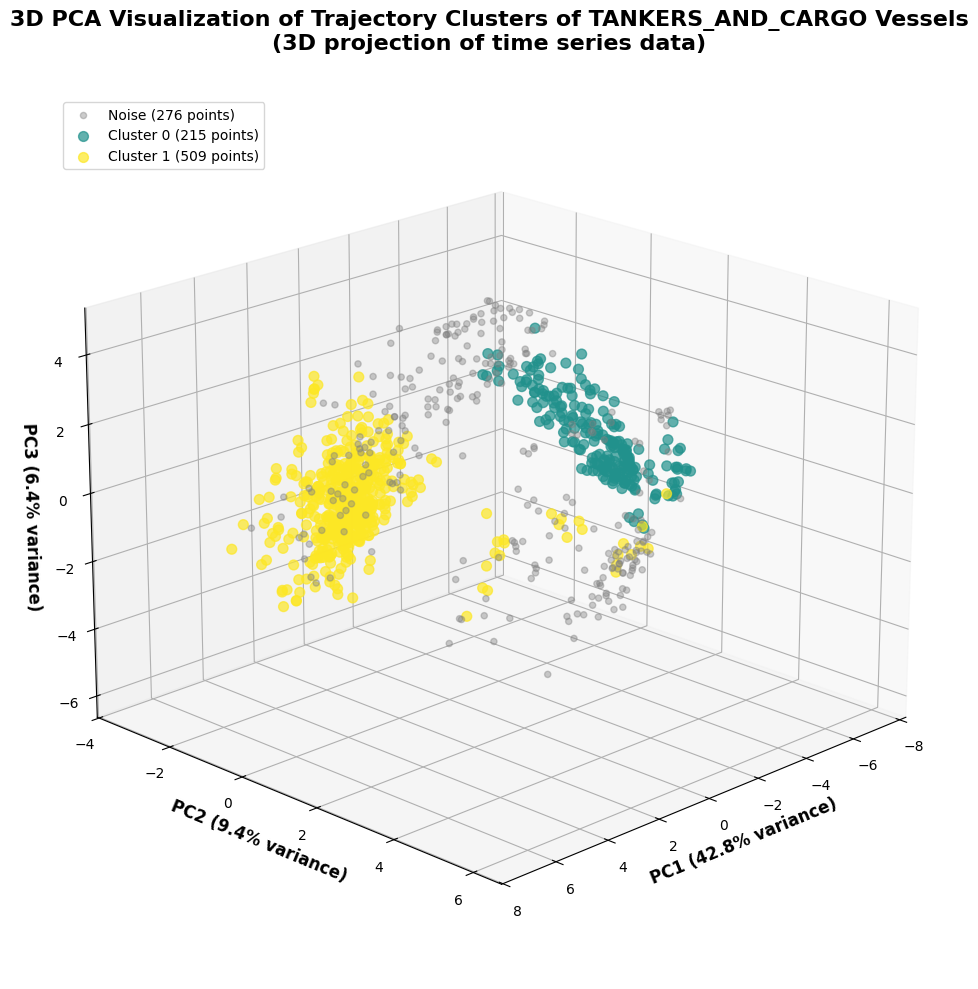


3D PCA Analysis Summary:
- Original dimensionality: 576 features
- Reduced to: 3 components
- Information preserved: 58.6%
- PC1 explains 42.8% of variance
- PC2 explains 9.4% of variance
- PC3 explains 6.4% of variance

Cluster Separation Analysis:
Cluster 0: Center=(-6.33, -0.13, -0.42), Spread=(0.78, 0.87, 1.21)
Cluster 1: Center=(2.78, -0.59, -0.28), Spread=(1.40, 1.29, 1.18)


In [56]:
# Randomly select data points for PCA plotting
# set seed for reproducibility
np.random.seed(42)

# Randomly select a subset of data points for PCA plotting
n_samples = 1000
indices = np.random.choice(X_train_arr.shape[0], size=n_samples, replace=False)
X_pca = X_train_arr[indices]
y_pca = y_train.values[indices]

plot_pca(X_pca, y_pca)

In [57]:
# Use original X_sample (not transposed) for plotting
sample_and_label = list(zip(X_pca, y_pca))

# convert normalized back to lat/lon
lat_min, lat_max = 20, 60
lon_min, lon_max = -160, -60
max_sog = 30
max_cog = 360

In [82]:
# gather sample trajectories for reporting
sample_trajectories = []


In [83]:

# filter samples with label
label = 1 # Change as needed
filtered_samples = [sample for sample, lbl in sample_and_label if lbl == label]
# len(filtered_samples)

filtered_samples_indexes_to_plot = (2, 3, 10, 11)

# Create subplots for trajectory plots with improved visibility
nols = 2
nrows = math.ceil(len(filtered_samples_indexes_to_plot) / nols)

fig, axes = plt.subplots(nrows, nols, figsize=(20, 20), dpi= 500)
fig.suptitle(f'Vessel Trajectories with Cluster Label {label} - Speed Colored', fontsize=18, fontweight='bold', y=0.98)

# Flatten axes array for easy iteration
axes_flat = axes.flatten()

# plot 4 samples with label in subplots
for i, j in enumerate(filtered_samples_indexes_to_plot):
    # remove the padding (rows of zeros at the end)
    filtered_samples[j] = remove_trailing_padding(filtered_samples[j])
    # denormalize
    filtered_samples[j] = denormalize_coordinates(filtered_samples[j])

    # save sample info for reporting
    dict_entry = {}
    dict_entry['dbscan_label'] = label
    dict_entry['sample'] = i+1
    dict_entry['num_points_sample'] = filtered_samples[j].shape[0]
    dict_entry['duration_hours_sample'] = (10 * filtered_samples[j].shape[0]) / 60
    dict_entry['traj'] = filtered_samples[j]
    sample_trajectories.append(dict_entry)

    # Extract coordinates, speed, and course
    longitudes = filtered_samples[j][:, 1]
    latitudes = filtered_samples[j][:, 0]
    speeds = filtered_samples[j][:, 2]  # Speed Over Ground (SOG)
    cog_degrees = filtered_samples[j][:, 3]  # Course Over Ground (COG)
    
    # Select the appropriate subplot
    ax = axes_flat[i]
    
    # Create scatter plot with colors based on speed - BACK TO ORIGINAL VIRIDIS
    scatter = ax.scatter(longitudes, latitudes, c=speeds, cmap='viridis', 
                        s=80, alpha=0.9, edgecolors='white', linewidth=1.2)
    
    # Connect points with lines to show trajectory - GRAY, THIN, DASHED
    ax.plot(longitudes, latitudes, color='gray', alpha=0.6, linewidth=1.0, linestyle='--')
    
    # Add course arrows to show direction - LARGER ARROWS
    # add_course_arrows(ax, longitudes, latitudes, cog_degrees, spacing=15, arrow_scale=0.01)
    
    # Add colorbar to show speed scale - LARGER TEXT
    cbar = plt.colorbar(scatter, ax=ax, shrink=0.8)
    cbar.set_label('Speed (knots)', fontsize=12, fontweight='bold')
    cbar.ax.tick_params(labelsize=11.5)
    
    # Improved grid and styling
    ax.grid(True, alpha=0.4, linewidth=0.8, linestyle='--')
    ax.set_facecolor('#f8f9fa')  # Light background
    
    # LARGER, BOLDER TITLES AND LABELS
    ax.set_title(f'Sample {i+1} - Trajectory\nDuration: {(10 * filtered_samples[j].shape[0]) / 60:.1f} hrs', 
                fontsize=14, fontweight='bold', pad=15)
    ax.set_xlabel('Longitude', fontsize=12, fontweight='bold')
    ax.set_ylabel('Latitude', fontsize=12, fontweight='bold')
    
    # Larger tick labels
    ax.tick_params(axis='both', which='major', labelsize=11.5)
    
    # Find the best position for text box to avoid data overlap
    text_x, text_y, h_align, v_align = find_best_text_position(longitudes, latitudes)
    
    # Add speed and COG statistics with improved visibility
    speed_stats = f'Speed: {speeds.min():.1f}-{speeds.max():.1f} knots\nAvg: {speeds.mean():.1f} knots'
    cog_stats = add_cog_statistics_text(ax, cog_degrees, text_x, text_y, h_align, v_align)
    
    # IMPROVED TEXT BOX with better contrast and larger font
    ax.text(text_x, text_y, f'{speed_stats}\n{cog_stats}', 
            transform=ax.transAxes, fontsize=11, fontweight='bold',
            verticalalignment=v_align, horizontalalignment=h_align,
            bbox=dict(boxstyle='round,pad=0.6', facecolor='white', alpha=0.95, 
                     edgecolor='black', linewidth=1.5))

   
# Better spacing between subplots
plt.subplots_adjust(hspace=0.2, wspace=0.2, top=0.93)
plt.show()

In [87]:
# filter samples with label
label = 0 # Change as needed
filtered_samples = [sample for sample, lbl in sample_and_label if lbl == label]
# len(filtered_samples)

filtered_samples_indexes_to_plot = (0, 10, 5, 14)

# Create subplots for trajectory plots with improved visibility
nols = 2
nrows = math.ceil(len(filtered_samples_indexes_to_plot) / nols)

fig, axes = plt.subplots(nrows, nols, figsize=(20, 20), dpi= 500)
fig.suptitle(f'Vessel Trajectories with Cluster Label {label} - Speed Colored', fontsize=18, fontweight='bold', y=0.98)

# Flatten axes array for easy iteration
axes_flat = axes.flatten()

# plot 4 samples with label in subplots
for i, j in enumerate(filtered_samples_indexes_to_plot):
    # remove the padding (rows of zeros at the end)
    filtered_samples[j] = remove_trailing_padding(filtered_samples[j])
    # denormalize
    filtered_samples[j] = denormalize_coordinates(filtered_samples[j])
    
    dict_entry = {}
    dict_entry['dbscan_label'] = label
    dict_entry['sample'] = i+1
    dict_entry['num_points_sample'] = filtered_samples[j].shape[0]
    dict_entry['duration_hours_sample'] = (10 * filtered_samples[j].shape[0]) / 60
    dict_entry['traj'] = filtered_samples[j]
    sample_trajectories.append(dict_entry)

    # Extract coordinates, speed, and course
    longitudes = filtered_samples[j][:, 1]
    latitudes = filtered_samples[j][:, 0]
    speeds = filtered_samples[j][:, 2]  # Speed Over Ground (SOG)
    cog_degrees = filtered_samples[j][:, 3]  # Course Over Ground (COG)
    
    # Select the appropriate subplot
    ax = axes_flat[i]
    
    # Create scatter plot with colors based on speed - BACK TO ORIGINAL VIRIDIS
    scatter = ax.scatter(longitudes, latitudes, c=speeds, cmap='viridis', 
                        s=80, alpha=0.9, edgecolors='white', linewidth=1.2)
    
    # Connect points with lines to show trajectory - GRAY, THIN, DASHED
    ax.plot(longitudes, latitudes, color='gray', alpha=0.6, linewidth=1.0, linestyle='--')
    
    # Add course arrows to show direction - LARGER ARROWS
    # add_course_arrows(ax, longitudes, latitudes, cog_degrees, spacing=15, arrow_scale=0.01)
    
    # Add colorbar to show speed scale - LARGER TEXT
    cbar = plt.colorbar(scatter, ax=ax, shrink=0.8)
    cbar.set_label('Speed (knots)', fontsize=12, fontweight='bold')
    cbar.ax.tick_params(labelsize=11.5)
    
    # Improved grid and styling
    ax.grid(True, alpha=0.4, linewidth=0.8, linestyle='--')
    ax.set_facecolor('#f8f9fa')  # Light background
    
    # LARGER, BOLDER TITLES AND LABELS
    ax.set_title(f'Sample {i+1} - Trajectory\nDuration: {(10 * filtered_samples[j].shape[0]) / 60:.1f} hrs', 
                fontsize=14, fontweight='bold', pad=15)
    ax.set_xlabel('Longitude', fontsize=12, fontweight='bold')
    ax.set_ylabel('Latitude', fontsize=12, fontweight='bold')
    
    # Larger tick labels
    ax.tick_params(axis='both', which='major', labelsize=11.5)
    
    # Find the best position for text box to avoid data overlap
    text_x, text_y, h_align, v_align = find_best_text_position(longitudes, latitudes)
    
    # Add speed and COG statistics with improved visibility
    speed_stats = f'Speed: {speeds.min():.1f}-{speeds.max():.1f} knots\nAvg: {speeds.mean():.1f} knots'
    cog_stats = add_cog_statistics_text(ax, cog_degrees, text_x, text_y, h_align, v_align)
    
    # IMPROVED TEXT BOX with better contrast and larger font
    ax.text(text_x, text_y, f'{speed_stats}\n{cog_stats}', 
            transform=ax.transAxes, fontsize=11, fontweight='bold',
            verticalalignment=v_align, horizontalalignment=h_align,
            bbox=dict(boxstyle='round,pad=0.6', facecolor='white', alpha=0.95, 
                     edgecolor='black', linewidth=1.5))

# Better spacing between subplots
plt.subplots_adjust(hspace=0.2, wspace=0.2, top=0.93)
plt.show()

In [88]:
# filter samples with label
label = -1 # Change as needed
filtered_samples = [sample for sample, lbl in sample_and_label if lbl == label]
# len(filtered_samples)

filtered_samples_indexes_to_plot = (14, 7, 28, 26)

# Create subplots for trajectory plots with improved visibility
nols = 2
nrows = math.ceil(len(filtered_samples_indexes_to_plot) / nols)

fig, axes = plt.subplots(nrows, nols, figsize=(20, 20), dpi= 500)
fig.suptitle(f'Vessel Trajectories with Cluster Label {label} - Speed Colored', fontsize=18, fontweight='bold', y=0.98)

# Flatten axes array for easy iteration
axes_flat = axes.flatten()

# plot 4 samples with label in subplots
for i, j in enumerate(filtered_samples_indexes_to_plot):
    # remove the padding (rows of zeros at the end)
    filtered_samples[j] = remove_trailing_padding(filtered_samples[j])
    # denormalize
    filtered_samples[j] = denormalize_coordinates(filtered_samples[j])
    
    dict_entry = {}
    dict_entry['dbscan_label'] = label
    dict_entry['sample'] = i+1
    dict_entry['num_points_sample'] = filtered_samples[j].shape[0]
    dict_entry['duration_hours_sample'] = (10 * filtered_samples[j].shape[0]) / 60
    dict_entry['traj'] = filtered_samples[j]
    sample_trajectories.append(dict_entry)

    # Extract coordinates, speed, and course
    longitudes = filtered_samples[j][:, 1]
    latitudes = filtered_samples[j][:, 0]
    speeds = filtered_samples[j][:, 2]  # Speed Over Ground (SOG)
    cog_degrees = filtered_samples[j][:, 3]  # Course Over Ground (COG)
    
    # Select the appropriate subplot
    ax = axes_flat[i]
    
    # Create scatter plot with colors based on speed - BACK TO ORIGINAL VIRIDIS
    scatter = ax.scatter(longitudes, latitudes, c=speeds, cmap='viridis', 
                        s=80, alpha=0.9, edgecolors='white', linewidth=1.2)
    
    # Connect points with lines to show trajectory - GRAY, THIN, DASHED
    ax.plot(longitudes, latitudes, color='gray', alpha=0.6, linewidth=1.0, linestyle='--')
    
    # Add course arrows to show direction - LARGER ARROWS
    # add_course_arrows(ax, longitudes, latitudes, cog_degrees, spacing=15, arrow_scale=0.01)
    
    # Add colorbar to show speed scale - LARGER TEXT
    cbar = plt.colorbar(scatter, ax=ax, shrink=0.8)
    cbar.set_label('Speed (knots)', fontsize=12, fontweight='bold')
    cbar.ax.tick_params(labelsize=11.5)
    
    # Improved grid and styling
    ax.grid(True, alpha=0.4, linewidth=0.8, linestyle='--')
    ax.set_facecolor('#f8f9fa')  # Light background
    
    # LARGER, BOLDER TITLES AND LABELS
    ax.set_title(f'Sample {i+1} - Trajectory\nDuration: {(10 * filtered_samples[j].shape[0]) / 60:.1f} hrs', 
                fontsize=14, fontweight='bold', pad=15)
    ax.set_xlabel('Longitude', fontsize=12, fontweight='bold')
    ax.set_ylabel('Latitude', fontsize=12, fontweight='bold')
    
    # Larger tick labels
    ax.tick_params(axis='both', which='major', labelsize=11.5)
    
    # Find the best position for text box to avoid data overlap
    text_x, text_y, h_align, v_align = find_best_text_position(longitudes, latitudes)
    
    # Add speed and COG statistics with improved visibility
    speed_stats = f'Speed: {speeds.min():.1f}-{speeds.max():.1f} knots\nAvg: {speeds.mean():.1f} knots'
    cog_stats = add_cog_statistics_text(ax, cog_degrees, text_x, text_y, h_align, v_align)
    
    # IMPROVED TEXT BOX with better contrast and larger font
    ax.text(text_x, text_y, f'{speed_stats}\n{cog_stats}', 
            transform=ax.transAxes, fontsize=11, fontweight='bold',
            verticalalignment=v_align, horizontalalignment=h_align,
            bbox=dict(boxstyle='round,pad=0.6', facecolor='white', alpha=0.95, 
                     edgecolor='black', linewidth=1.5))

# Better spacing between subplots
plt.subplots_adjust(hspace=0.2, wspace=0.2, top=0.93)
plt.show()

In [89]:
sample_trajectories, len(sample_trajectories)

([{'dbscan_label': 1,
   'sample': 1,
   'num_points_sample': 144,
   'duration_hours_sample': 24.0,
   'traj': array([[ 2.96745140e+01, -9.12270146e+01,  5.00285714e+00,
            2.34554286e+02],
          [ 2.96651996e+01, -9.12374407e+01,  4.80142857e+00,
            2.05648571e+02],
          [ 2.96578675e+01, -9.12467494e+01,  3.55915493e+00,
            2.48742254e+02],
          [ 2.96540680e+01, -9.12579400e+01,  3.80000000e+00,
            2.57180000e+02],
          [ 2.96523143e+01, -9.12685686e+01,  3.50000000e+00,
            2.64671429e+02],
          [ 2.96481310e+01, -9.12778661e+01,  3.41126761e+00,
            2.39711268e+02],
          [ 2.96463089e+01, -9.12870053e+01,  2.80253165e+00,
            2.69902532e+02],
          [ 2.96447294e+01, -9.12947897e+01,  2.63714286e+00,
            2.58334286e+02],
          [ 2.96422070e+01, -9.13052801e+01,  3.60000000e+00,
            2.62146479e+02],
          [ 2.96400585e+01, -9.13167259e+01,  3.66901408e+00,
          

In [91]:
sample_trajectories[9]

{'dbscan_label': -1,
 'sample': 2,
 'num_points_sample': 93,
 'duration_hours_sample': 15.5,
 'traj': array([[ 3.36921700e+01, -9.12200500e+01,  4.20000000e+00,
          4.50000000e+01],
        [ 3.36997305e+01, -9.12129364e+01,  3.16753927e+00,
          4.81832461e+01],
        [ 3.37021714e+01, -9.11996685e+01,  4.49612591e+00,
          6.90682809e+01],
        [ 3.37030670e+01, -9.11849808e+01,  4.35084746e+00,
          8.41288136e+01],
        [ 3.37051326e+01, -9.11714071e+01,  3.96451613e+00,
          6.82548387e+01],
        [ 3.37105838e+01, -9.11604978e+01,  3.77000000e+00,
          5.34700000e+01],
        [ 3.37158266e+01, -9.11533264e+01,  2.30000000e+00,
          2.27728571e+01],
        [ 3.37218442e+01, -9.11483366e+01,  3.79577465e+00,
          1.70422535e+01],
        [ 3.37328171e+01, -9.11463557e+01,  3.62857143e+00,
          3.38571429e+00],
        [ 3.37424886e+01, -9.11436187e+01,  3.55428571e+00,
          1.81342857e+01],
        [ 3.37505000e+01, -9.

In [97]:
predicted_samples_list[2]

{'sample': 3,
 'mmsi': 366917140,
 'duration_hours': 14.833333333333334,
 'predicted_label': -1,
 'traj': array([[ 3.79145900e+01, -8.98666400e+01,  6.10000000e+00,
          2.93400000e+02],
        [ 3.79259013e+01, -8.98820778e+01,  5.92352941e+00,
          3.06094118e+02],
        [ 3.79388590e+01, -8.98958788e+01,  5.67142857e+00,
          3.17942857e+02],
        [ 3.79431529e+01, -8.99004868e+01,  4.92838735e+00,
          3.26152401e+02],
        [ 3.79440221e+01, -8.99014590e+01,  3.99125342e+00,
          3.32923194e+02],
        [ 3.79448913e+01, -8.99024313e+01,  3.05411948e+00,
          3.39693987e+02],
        [ 3.79457605e+01, -8.99034036e+01,  2.11698555e+00,
          3.46464779e+02],
        [ 3.79517775e+01, -8.99058700e+01,  6.47500000e+00,
          3.44350000e+02],
        [ 3.79636415e+01, -8.99166925e+01,  5.88144775e+00,
          3.27955609e+02],
        [ 3.79631816e+01, -8.99358203e+01,  5.79515820e+00,
          3.09144487e+02],
        [ 3.79627186e+01,

In [100]:
# Save sample trajectories to a file for reporting
import pickle
import os
os.makedirs('output_reports', exist_ok=True)

with open('output_reports/sample_trajectories.pkl', 'wb') as f:
    pickle.dump(sample_trajectories, f)
# save predicted samples to a file for reporting
with open('output_reports/predicted_samples.pkl', 'wb') as f:
    pickle.dump(predicted_samples_list, f)